In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go
import itertools

from IPython.display import Markdown, display
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
from wordcloud import WordCloud
import re

import warnings
warnings.simplefilter(action='ignore', category=Warning)

In [2]:
train = pd.read_csv(r"C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/train.csv")
train.head()

,id,sentence,split
0,000005f3362c,ও বলেছে আপনার ঠিকানা!,train
1,00001dddd002,কোন মহান রাষ্ট্রের নাগরিক হতে চাও?,train
2,00001e0bc131,"আমি তোমার কষ্টটা বুঝছি, কিন্তু এটা সঠিক পথ না।",train
3,000024b3d810,নাচ শেষ হওয়ার পর সকলে শরীর ধুয়ে একসঙ্গে ভোজন...,train
4,000028220ab3,"হুমম, ওহ হেই, দেখো।",train


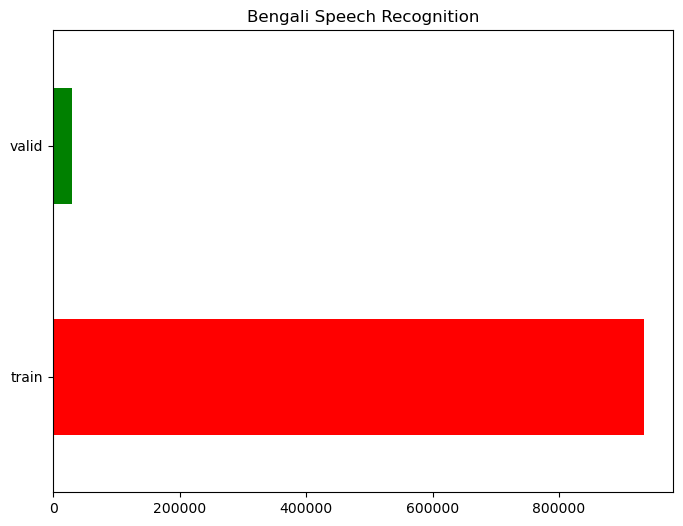

In [40]:
train["split"].value_counts().plot.barh(figsize = (8,6),color=['red', 'green'], title='Bengali Speech Recognition');

In [4]:
sample = pd.read_csv("C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/sample_submission.csv")
sample.head()

,id,sentence
0,0f3dac00655e,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...
1,a9395e01ad21,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...
2,bf36ea8b718d,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...


In [5]:
%%capture
!pip install langdetect # Language Detection
!pip install bnlp_toolkit # For Bangla Word Cloud
!wget https://www.omicronlab.com/download/fonts/kalpurush.ttf # Bangla Font For the Word Cloud

In [6]:
!pip install langdetect

def printmd(string):
  display(Markdown(string))

from langdetect import detect
import unicodedata
import html

In [7]:
!pip install bnlp_toolkit


In [8]:
!pip install pydub

In [9]:
import os

bengali = []
cwd = r"C:\Users\naimu\Music\Speech Recognition ML DL AI\Dataset\Bangla Text  & Voice Dateset\Voice Data"

for dirname, _, filenames in os.walk(cwd):
    for filename in filenames:
        bengali.append(filename)
# data = pd.read_csv('/kaggle/input/us-election-2020-presidential-debates/us_election_2020_1st_presidential_debate.csv')
bengali.pop(2)  # Original is 0 zero though the 1st mp3 is on the 13th line. They are not in order here.
# I chose Slang Profanity manually

'Bengali Advertisement.wav'

In [10]:
from pydub import AudioSegment
import IPython

# Define the file path
file = r"C:\Users\naimu\Music\Speech Recognition ML DL AI\Dataset\Bangla Text  & Voice Dateset\Voice Data\Stage Drama Jatra.wav"

# Display the audio
IPython.display.Audio(file)


In [11]:
import subprocess
import glob
import os
from pathlib import Path
import shutil
from zipfile import ZipFile

In [12]:
! tar xvf "C:\Users\naimu\Music\Speech Recognition ML DL AI\Dataset\Bangla Text  & Voice Dateset\FFmpeg\ffmpeg-6.1.1.tar.xz"

x ffmpeg-6.1.1/
x ffmpeg-6.1.1/Makefile
x ffmpeg-6.1.1/libavcodec/
x ffmpeg-6.1.1/libavcodec/roqvideo.h
x ffmpeg-6.1.1/libavcodec/txd.c
x ffmpeg-6.1.1/libavcodec/h264dsp_template.c
x ffmpeg-6.1.1/libavcodec/v4l2_context.c
x ffmpeg-6.1.1/libavcodec/png_parser.c
x ffmpeg-6.1.1/libavcodec/dxva2.c
x ffmpeg-6.1.1/libavcodec/qcelpdata.h
x ffmpeg-6.1.1/libavcodec/adx.c
x ffmpeg-6.1.1/libavcodec/aacps_fixed.c
x ffmpeg-6.1.1/libavcodec/amrnbdata.h
x ffmpeg-6.1.1/libavcodec/lossless_videoencdsp.c
x ffmpeg-6.1.1/libavcodec/snappy.c
x ffmpeg-6.1.1/libavcodec/cfhdencdsp.c
x ffmpeg-6.1.1/libavcodec/pcx.c
x ffmpeg-6.1.1/libavcodec/dv_profile_internal.h
x ffmpeg-6.1.1/libavcodec/vulkan_av1.c
x ffmpeg-6.1.1/libavcodec/alac_data.h
x ffmpeg-6.1.1/libavcodec/dcadct.c
x ffmpeg-6.1.1/libavcodec/pcm-dvdenc.c
x ffmpeg-6.1.1/libavcodec/ttadsp.h
x ffmpeg-6.1.1/libavcodec/libopenh264dec.c
x ffmpeg-6.1.1/libavcodec/screenpresso.c
x ffmpeg-6.1.1/libavcodec/ilbcdec.c
x ffmpeg-6.1.1/libavcodec/mathtables.c
x ffmpeg-

In [13]:
import os

# Define the directory containing the MP3 files
mp3_dir = r"C:\Users\naimu\Music\Speech Recognition ML DL AI\Dataset\Bangla Text  & Voice Dateset\Voice Data"

# List all MP3 files in the directory
songs = [filename for filename in os.listdir(mp3_dir) if filename.endswith('.mp3')]


In [14]:
from scipy.io.wavfile import read, write
#a = read("adios.wav")
wavs = []
np_arrays = []
for dirname, _, filenames in os.walk('/kaggle/working/wavs/'):
    for filename in filenames:
        wav_file = dirname+filename
        #print(wav_file)
        wavs.append(wav_file)
        try:
            fs, io_file = read(wav_file)
        except ValueError:
            continue
        data = np.array(io_file,dtype=float)
        wav_info= {
            'name': filename,
            'fs' : fs,
            'left': data[:,0],
            'right': data[:,1]
        }
        
        np_arrays.append(wav_info)

print("Succesfully converted: "+str(len(np_arrays)))

Succesfully converted: 0


In [15]:
!pip install librosa

In [16]:
import librosa
import librosa.display
import json
import tensorflow as tf
from matplotlib.pyplot import specgram
import glob 
import os
from tqdm import tqdm
import pickle
import IPython.display as ipd  # To play sound in the notebook

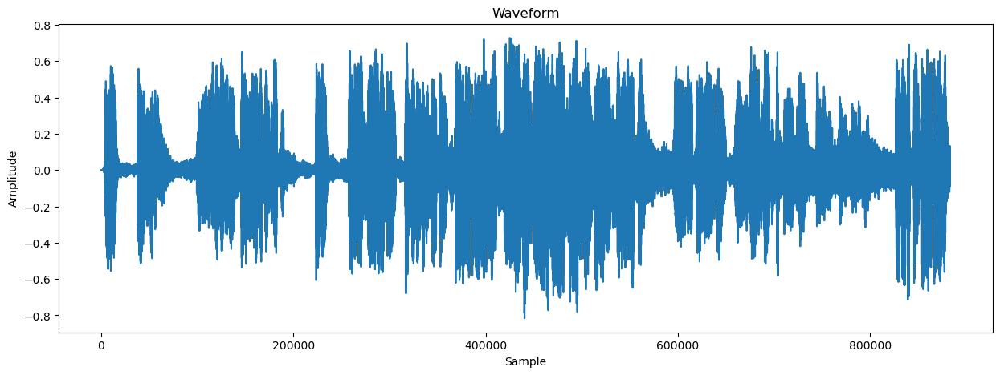

In [17]:
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd

# Use one audio file in previous parts again
fname = "C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/Voice Data\Poem Recital.wav"
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
plt.plot(data)  # Plot the waveform
plt.title('Waveform')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play it again to refresh our memory
ipd.Audio(data, rate=sampling_rate)

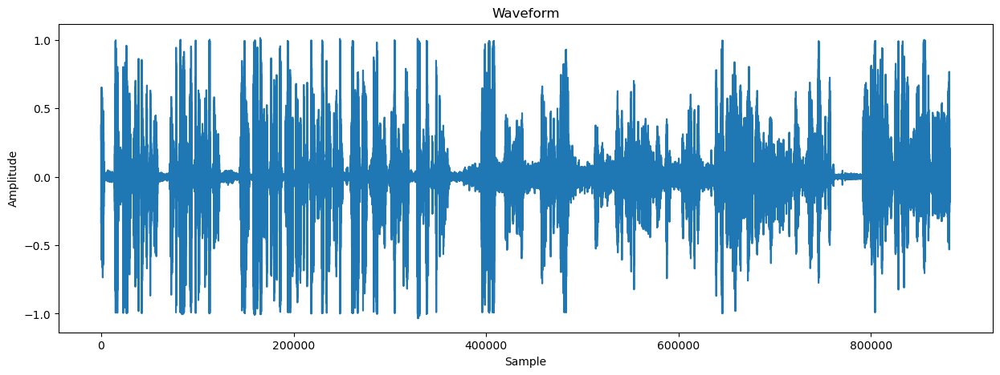

In [18]:
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd

# Use one audio file in previous parts again
fname = "C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/Voice Data\Talk Show Interview.wav"
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
plt.plot(data)  # Plot the waveform
plt.title('Waveform')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play it again to refresh our memory
ipd.Audio(data, rate=sampling_rate)

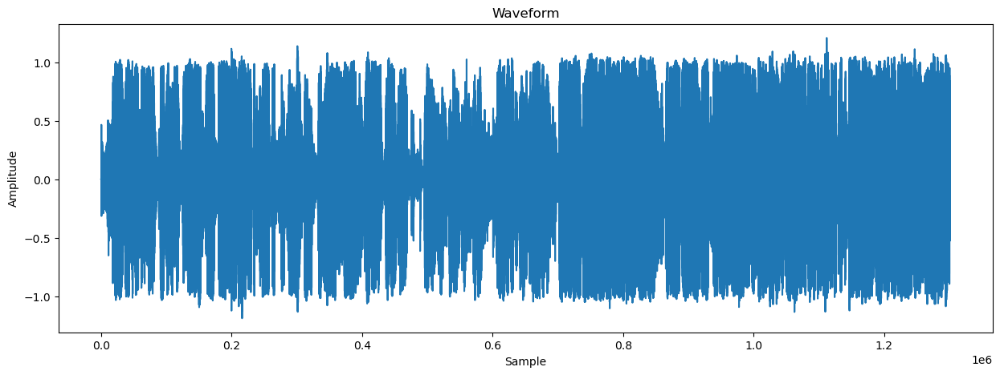

In [19]:
# Use one audio file in previous parts again
fname = "C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/Voice Data\Bengali Advertisement.wav"
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
plt.plot(data)  # Plot the waveform
plt.title('Waveform')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play it again to refresh our memory
ipd.Audio(data, rate=sampling_rate)

In [20]:
general_path = "C:/Users/naimu/Music/Speech Recognition ML DL AI/Dataset/Bangla Text  & Voice Dateset/Voice Data"

In [21]:
import numpy as np
import librosa

# Assuming 'general_path' is defined elsewhere in your code
y, sr = librosa.load(f'{general_path}/Poem Recital.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')  # Import np here
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', len(y) / sr)  # No need for np here, use len()


y: [ 0.          0.          0.         ...  0.01337987 -0.02283673
 -0.03372705] 

y shape: (883032,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 40.04680272108843


In [22]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [ 5.8207661e-11  0.0000000e+00  5.8207661e-11 ...  1.3379868e-02
 -2.2836730e-02 -3.3727046e-02] 

Audio File shape: (882008,)


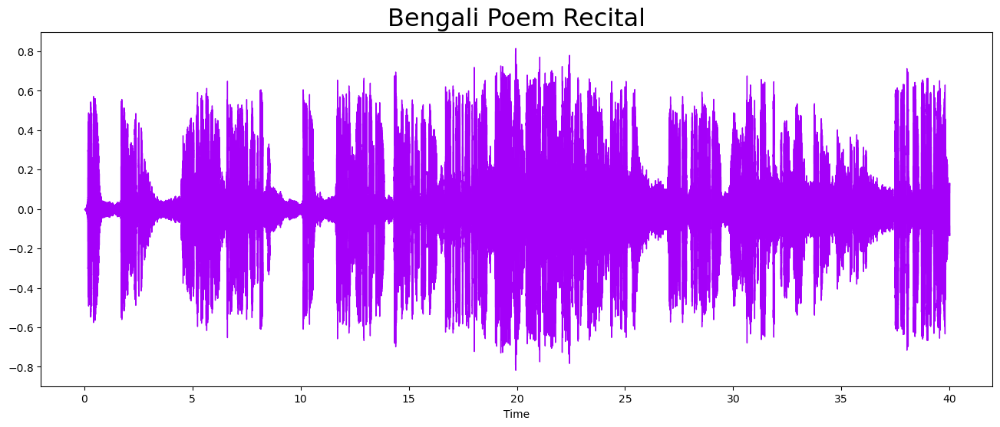

In [23]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(y = audio_file, sr = sr, color = "#A300F9");#Waveplot is waveshow
plt.title("Bengali Poem Recital", fontsize = 23);

In [24]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

Shape of D object: (1025, 1723)


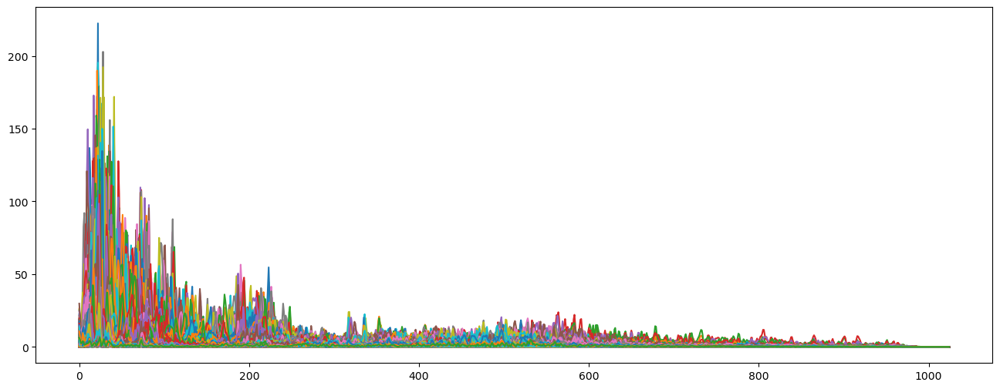

In [25]:
plt.figure(figsize = (16, 6))
plt.plot(D);

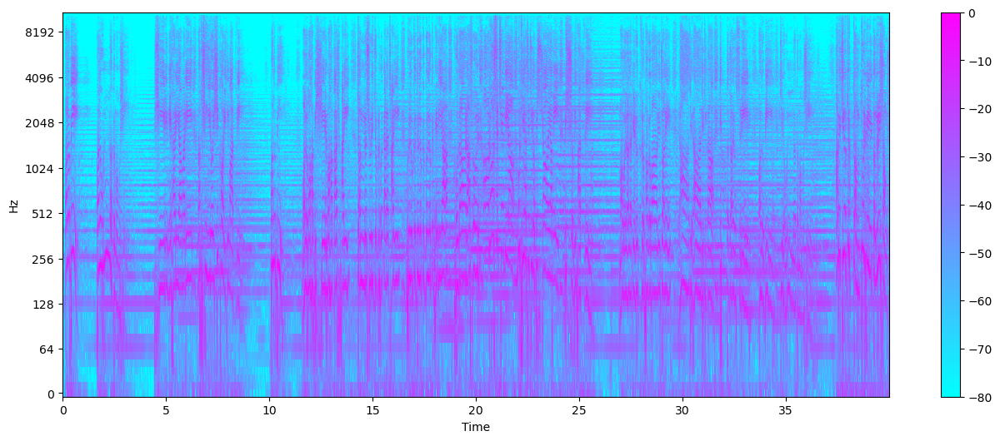

In [26]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

# Creating the Spectogram
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

In [27]:
!pip install librosa==0.9.2

  Using cached librosa-0.9.2-py3-none-any.whl (214 kB)
  Attempting uninstall: librosa
    Found existing installation: librosa 0.10.1
    Uninstalling librosa-0.10.1:
      Successfully uninstalled librosa-0.10.1


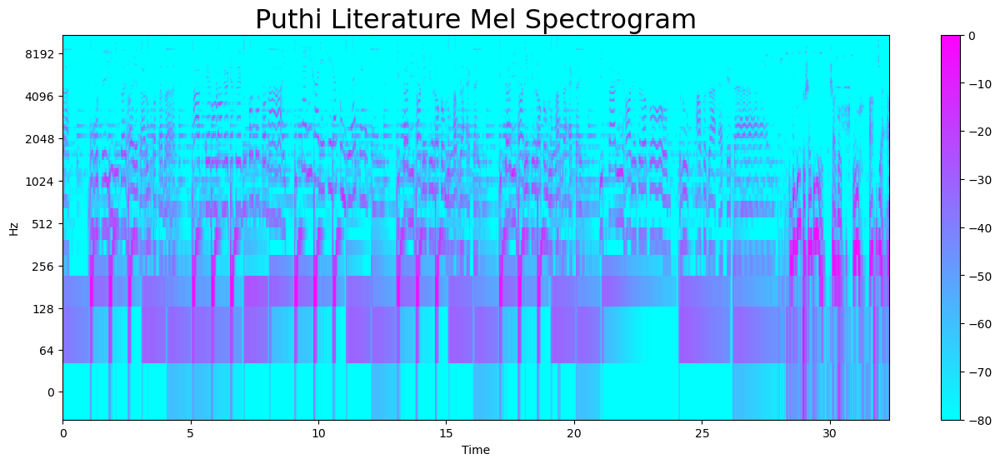

In [28]:
y, sr = librosa.load(f'{general_path}/Puthi Literature.wav')
y, _ = librosa.effects.trim(y)


S = librosa.feature.melspectrogram(y=y, sr=sr)#y=y fixed passes 0 argument error
S_DB = librosa.amplitude_to_db(S, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Puthi Literature Mel Spectrogram", fontsize = 23);

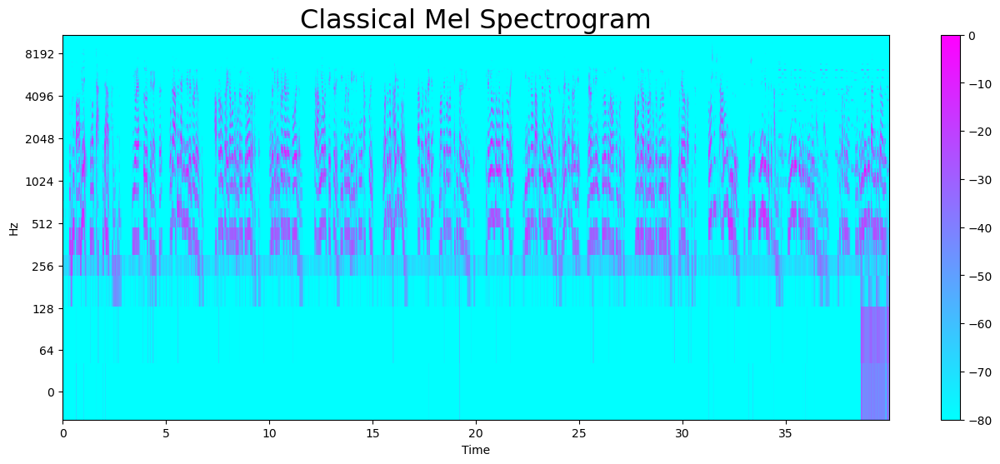

In [29]:
y, sr = librosa.load(f'{general_path}/Bangladeshi TV Drama.wav')
y, _ = librosa.effects.trim(y)


S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Classical Mel Spectrogram", fontsize = 23);

In [30]:
# Total zero_crossings in our 1 song
zero_crossings = librosa.zero_crossings(audio_file, pad=False)
print(sum(zero_crossings))

67495


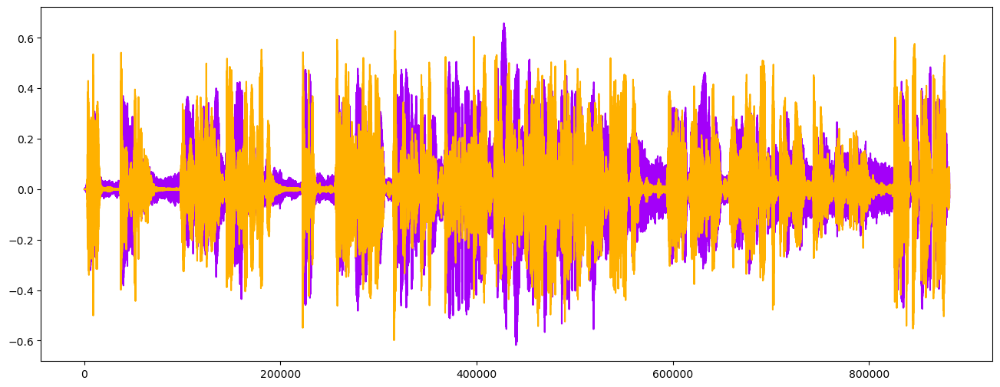

In [31]:
y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

In [32]:
!pip install --upgrade librosa


  Using cached librosa-0.10.1-py3-none-any.whl (253 kB)
  Attempting uninstall: librosa
    Found existing installation: librosa 0.9.2
    Uninstalling librosa-0.9.2:
      Successfully uninstalled librosa-0.9.2


In [33]:
tempo, _ = librosa.beat.beat_track(y=y, sr = sr)
tempo

117.45383522727273

In [34]:
# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]#Changed audio_file to y=y

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [1893.23386168 1765.41969279 1681.40215188 ... 1271.36253942 1242.42279357
 1420.0527656 ] 

Shape of Spectral Centroids: (1723,) 

frames: range(0, 1723) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 3.99383220e+01
 3.99615420e+01 3.99847619e+01]


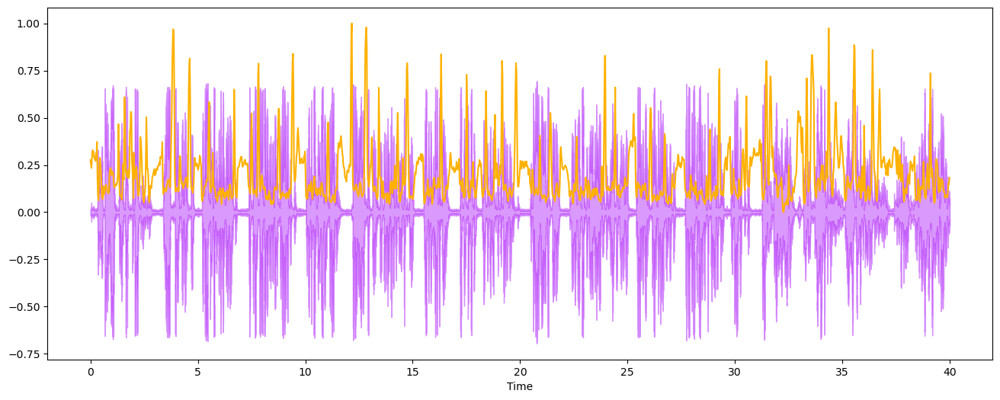

In [35]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
import IPython.display as ipd
import sklearn.preprocessing

# Assuming y and sr are already defined
# Assuming spectral_centroids and t are also defined

plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=y, sr=sr, alpha=0.4, color='#A300F9')
plt.plot(t, normalize(spectral_centroids), color='#FFB100')
plt.show()

# Define normalize function
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)


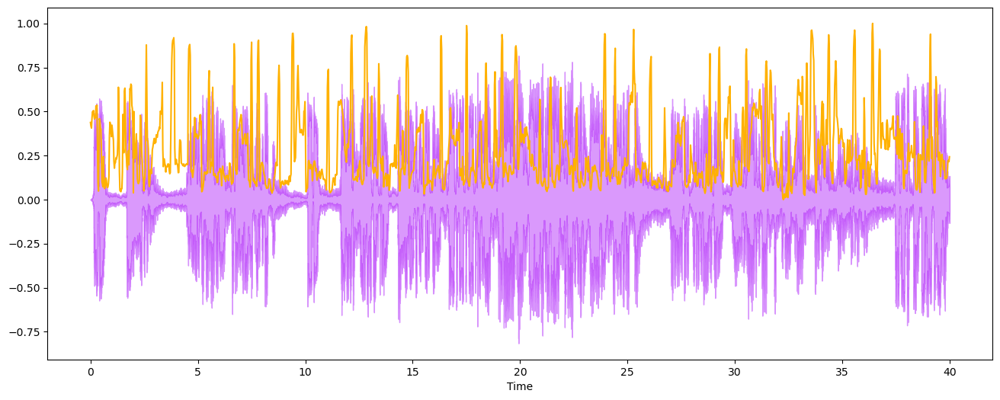

In [36]:
# Spectral RollOff Vector
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]

# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_rolloff), color='#FFB100');

Chromogram shape: (12, 177)


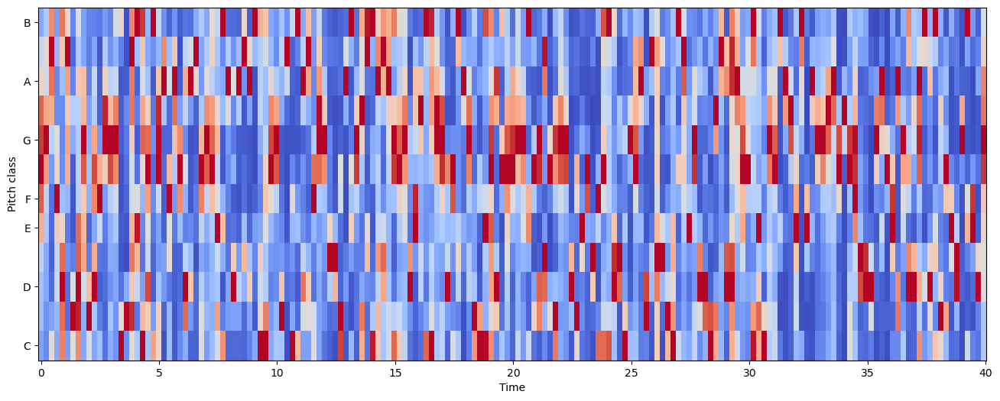

In [37]:
# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)#y=y fix error
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');

In [38]:

#1. **Importing Necessary Libraries:**
#   - Libraries like `numpy`, `pandas`, `matplotlib`, `seaborn`, `plotly`, `IPython.display`, `re`, and `warnings` are imported. These libraries are commonly used for data manipulation, visualization, and displaying Markdown content.

#2. **Loading Data:**
#  - The code reads the training data from a CSV file into a DataFrame using `pd.read_csv()`. It also reads a sample submission data CSV file.

#3. **Installing and Importing Additional Libraries:**
#   - The code installs and imports additional libraries like `langdetect`, `bnlp_toolkit`, and `pydub` using `pip install` and `import` statements.

#4. **Loading Audio Files and Processing:**
#   - Audio files are loaded using the `pydub` library. MP3 files are converted to WAV format. WAV files are then read using `librosa`, and various audio processing tasks such as trimming silence, computing spectrograms, etc., are performed.

#5. **Data Visualization and Analysis:**
#   - The code performs data visualization and analysis tasks using `librosa`, `matplotlib`, and `IPython.display`. It visualizes waveforms, spectrograms, chromagrams, etc., for the audio files.

#6. **Further Details:**
#   - The breakdown covers the main aspects of the provided code, including data loading, processing, visualization, and analysis. However, specific details of the code execution, such as file paths and specific data manipulation tasks, are not included in the provided code snippet.


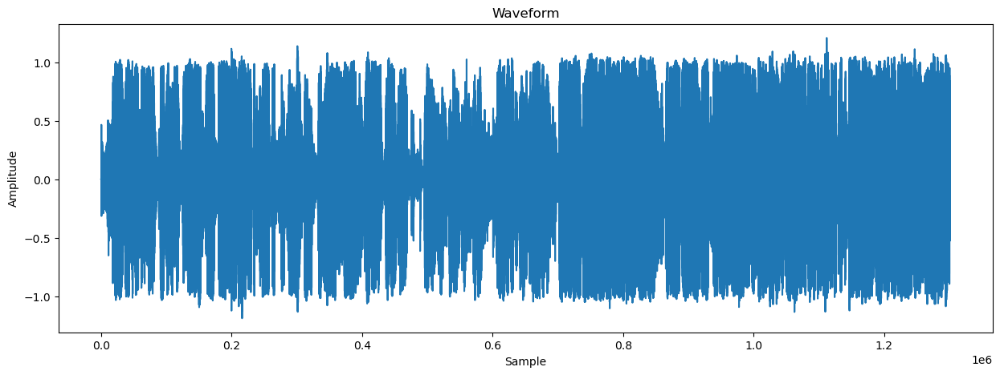

In [39]:
import os

# Specify the output directory where you want to save the graphs
output_directory = r"C:\Users\naimu\Music\Speech Recognition ML DL AI\wavs"

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Plot the waveform
plt.figure(figsize=(15, 5))
plt.plot(data)
plt.title('Waveform')
plt.xlabel('Sample')
plt.ylabel('Amplitude')

# Save the graph as a PNG file in the output directory
plt.savefig(os.path.join(output_directory, "waveform.png"))

plt.show()  # Show the plot